<a href="https://colab.research.google.com/github/andregri/Detecting-Road-Profile/blob/master/road_profile_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Download data

In [1]:
# Download the images
!sudo apt install megatools
!mkdir /content/data/
# How to download using mega: https://github.com/megous/megatools/issues/157
!megadl --path "/content/data/" "https://mega.nz/#F!JuAwGYCY!J1naVdtMAuR7U0XtfHHn4A"

Reading package lists... Done
Building dependency tree       
Reading state information... Done
megatools is already the newest version (1.9.98-1build2).
0 upgraded, 0 newly installed, 0 to remove and 11 not upgraded.
mkdir: cannot create directory ‘/content/data/’: File exists
ERROR: File already exists at /content/data/2018_IEEE_GRSS_DFC_GT_TR.tif
ERROR: File already exists at /content/data/UH_NAD83_272056_3289689.tfw
ERROR: File already exists at /content/data/UH_NAD83_272056_3289689.tif
ERROR: File already exists at /content/data/UH_NAD83_272652_3289689.tfw
ERROR: File already exists at /content/data/UH_NAD83_272652_3289689.tif
ERROR: File already exists at /content/data/UH_NAD83_273248_3289689.tfw
ERROR: File already exists at /content/data/UH_NAD83_273248_3289689.tif
ERROR: File already exists at /content/data/UH_NAD83_273844_3289689.tfw
ERROR: File already exists at /content/data/UH_NAD83_273844_3289689.tif
ERROR: File already exists at /content/data/M_GTmap_05.tif


In [2]:
gt_img_path = "/content/data/M_GTmap_05.tif"
img_paths = [
             "/content/data/UH_NAD83_272056_3289689.tif",
             "/content/data/UH_NAD83_272652_3289689.tif",
             "/content/data/UH_NAD83_273248_3289689.tif",
             "/content/data/UH_NAD83_273844_3289689.tif"
]

In [3]:
import tifffile as tiff
from matplotlib import pyplot as plt
import matplotlib as mpl
import numpy as np
import cv2
import random
import tensorflow as tf
from sklearn.feature_extraction.image import extract_patches_2d
!python --version

Python 3.6.9


# Load the dataset

(12020, 11920, 3)
uint8


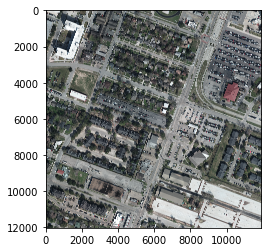

In [4]:
# Show an image
img_bgr = cv2.imread(img_paths[0], cv2.IMREAD_COLOR)
img = cv2.cvtColor(img_bgr,cv2.COLOR_BGR2RGB)  # Convert from bgr to rgb
print(img.shape)  # shape = (12020, 11920, 3)
print(img.dtype)
plt.imshow(img)
plt.show()

In [5]:
# Resample all the images so that they match the gt image: https://stackoverflow.com/questions/48121916/numpy-resize-rescale-image
# Resample the resolution from 0.05m to 0.5m
imgs = []
new_shape = (1192, 1202)
for path in img_paths:
  img_bgr = cv2.imread(path)
  img = cv2.cvtColor(img_bgr,cv2.COLOR_BGR2RGB)
  resampled = cv2.resize(img, dsize=new_shape, interpolation=cv2.INTER_NEAREST)
  imgs.append(resampled)

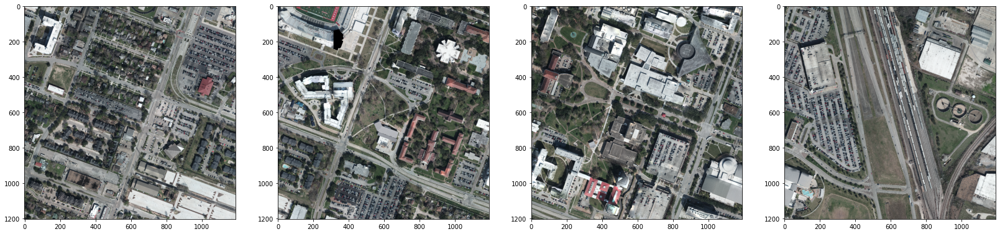

In [6]:
# Visualize 4 tiles resized
_, axs = plt.subplots(1, 4, figsize=(28, 7))
for i in range(4):
  axs[i].imshow(imgs[i])
plt.show()

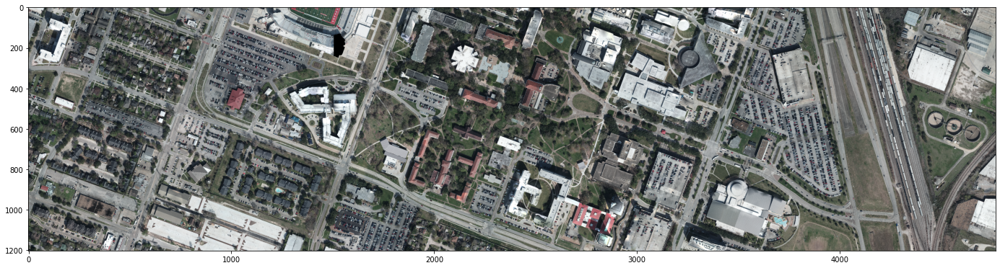

In [7]:
# Join the 4 images
img = np.concatenate(imgs, axis=1)

plt.figure(figsize=(24,7))
plt.imshow(img)
plt.show()

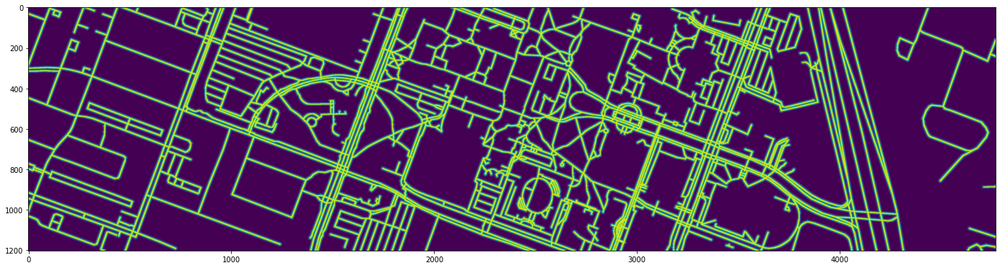

In [8]:
# Visualize the gt image
plt.figure(figsize=(24,7))
roadmap = tiff.imread(gt_img_path)
plt.imshow(roadmap)
plt.show()

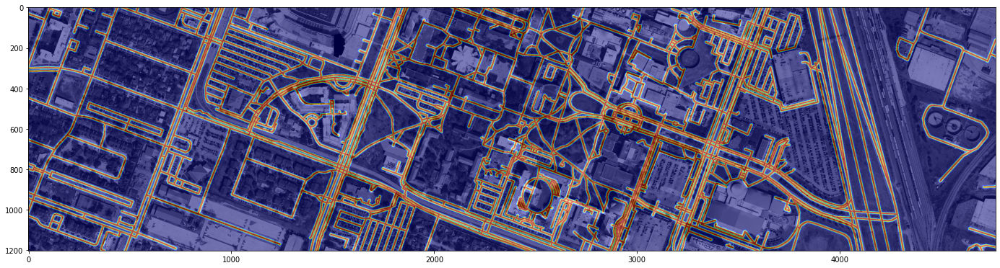

In [9]:
# Visualize the 2 images overlapped
plt.figure(figsize=(24,7))
plt.imshow(img[:,:,0], cmap='gray')
plt.imshow(roadmap, cmap='jet', alpha=0.5)
plt.show()

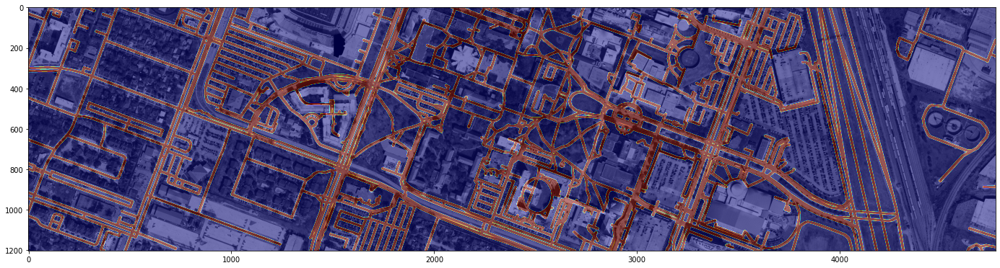

In [10]:
# Generate a binary mask
binary_roadmap = np.zeros(roadmap.shape)
binary_roadmap[roadmap > 0.3] = 1

# Visualize the binary roadmap
plt.figure(figsize=(24,7))
plt.imshow(img[:,:,0], cmap='gray')
plt.imshow(binary_roadmap, cmap='jet', alpha=0.5)
plt.show()

# Generate the patches

In [11]:
binary_roadmap.shape

(1202, 4768)

In [12]:
img.shape

(1202, 4768, 3)

4930
[(64, 64), (64, 96), (64, 128), (64, 160), (64, 192), (64, 224), (64, 256), (64, 288), (64, 320), (64, 352), (64, 384), (64, 416), (64, 448), (64, 480), (64, 512), (64, 544), (64, 576), (64, 608), (64, 640), (64, 672), (64, 704), (64, 736), (64, 768), (64, 800), (64, 832), (64, 864), (64, 896), (64, 928), (64, 960), (64, 992), (64, 1024), (64, 1056), (64, 1088), (64, 1120), (96, 64), (96, 96), (96, 128), (96, 160), (96, 192), (96, 224), (96, 256), (96, 288), (96, 320), (96, 352), (96, 384), (96, 416), (96, 448), (96, 480), (96, 512), (96, 544), (96, 576), (96, 608), (96, 640), (96, 672), (96, 704), (96, 736), (96, 768), (96, 800), (96, 832), (96, 864), (96, 896), (96, 928), (96, 960), (96, 992), (96, 1024), (96, 1056), (96, 1088), (96, 1120), (128, 64), (128, 96), (128, 128), (128, 160), (128, 192), (128, 224), (128, 256), (128, 288), (128, 320), (128, 352), (128, 384), (128, 416), (128, 448), (128, 480), (128, 512), (128, 544), (128, 576), (128, 608), (128, 640), (128, 672), (128

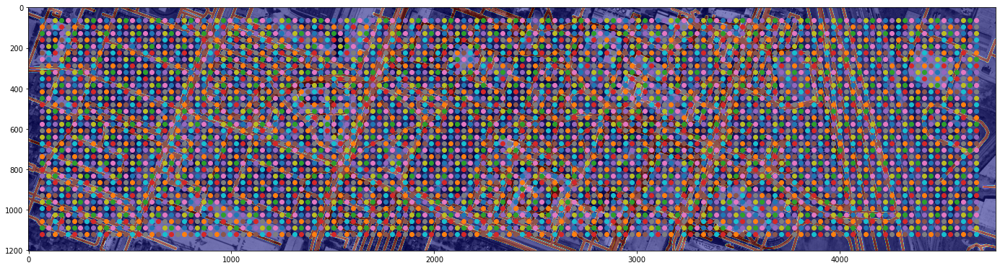

In [13]:
# Find the centers of the patches
centers = []
width_img = img.shape[1]
height_img = img.shape[0]

for col in range(64, width_img - 64, 32):
  for row in range(64, height_img - 64, 32):
    centers.append((col, row))

print(len(centers))
print(centers)

plt.figure(figsize=(24,7))
plt.imshow(img[:,:,0], cmap='gray')
plt.imshow(binary_roadmap, cmap='jet', alpha=0.5)
for i in range(len(centers)):
  plt.scatter(centers[i][0], centers[i][1])
plt.show()

In [14]:
# Find the INPUT patches centered in 'centers' and with side 128
X = []
for center in centers:
  col_center = center[0]
  row_center = center[1]
  col_min = col_center - 64
  col_max = col_center + 64
  row_min = row_center - 64
  row_max = row_center + 64
  #print(f"{col_min}, {col_max}, {row_min}, {row_max}")
  patch = img[row_min:row_max, col_min:col_max, :]
  X.append(patch)
print(len(X))

4930


In [15]:
# Find the TRUE patches centered in 'centers' with side 32
Y_true = []
for center in centers:
  col_center = center[0]
  row_center = center[1]
  col_min = col_center - 16
  col_max = col_center + 16
  row_min = row_center - 16
  row_max = row_center + 16
  #print(f"{col_min}, {col_max}, {row_min}, {row_max}")
  patch = binary_roadmap[row_min:row_max, col_min:col_max]
  Y_true.append(patch)
print(len(Y_true))

4930


823
(832, 288)


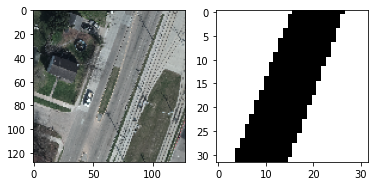

In [16]:
# Visualize a couple
idx = random.randint(0, len(X)-1)
print(idx)
print(centers[idx])
_, axs = plt.subplots(1, 2)
axs[0].imshow(X[idx])
axs[1].imshow(Y_true[idx], cmap='gray')
plt.show()

2565


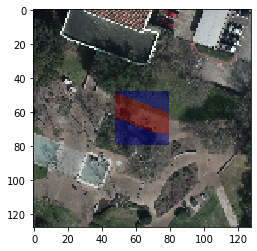

In [17]:
idx = random.randint(0, len(X)-1)
print(idx)
mask = np.zeros(X[idx].shape[:2])
c = centers[0]
mask[c[0]-16:c[0]+16, c[1]-16:c[1]+16] = Y_true[idx] + 1
masked = np.ma.masked_where(mask == 0, mask)

plt.imshow(X[idx], 'gray', interpolation='none')
plt.imshow(masked, 'jet', interpolation='none', alpha=0.5)
plt.show()

1689


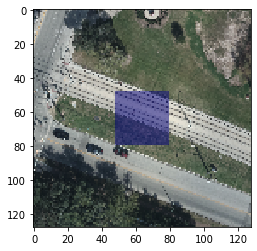

1690


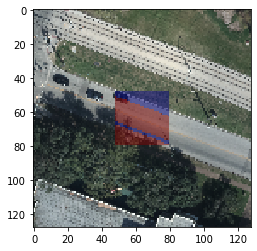

1691


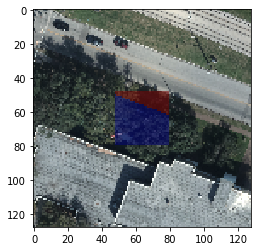

In [18]:
idx = random.randint(0, len(X)-1)
for idxx in [idx - 1, idx, idx + 1]:
  print(idxx)
  mask = np.zeros(X[idxx].shape[:2])
  c = centers[0]
  mask[c[0]-16:c[0]+16, c[1]-16:c[1]+16] = Y_true[idxx] + 1
  masked = np.ma.masked_where(mask == 0, mask)

  plt.imshow(X[idxx], 'gray', interpolation='none')
  plt.imshow(masked, 'jet', interpolation='none', alpha=0.5)
  plt.show()

# Generate the training set

In [19]:
# Rescale X
X = np.array(X)
X = X / 255.0

In [20]:
# Flatten Y_true

Y_true = np.array(Y_true) 
Y_true_flatten = np.array([np.ravel(Y_true[i]) for i in range(len(Y_true))])
print(Y_true_flatten.shape)

(4930, 1024)


In [21]:
# Split the dataset in training and validation
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, Y_true_flatten, test_size=0.01, random_state=42)

print(f"{X_train.shape}, {y_train.shape}")
print(f"{X_val.shape}, {y_val.shape}")

(4880, 128, 128, 3), (4880, 1024)
(50, 128, 128, 3), (50, 1024)


3918


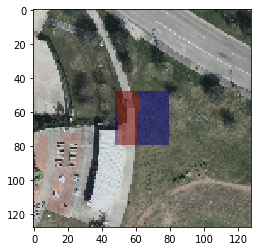

In [22]:
# Visualize a training pair
idx = random.randint(0, len(X_train)-1)
print(idx)
mask = np.zeros(X_train[idx].shape[:2])
c = centers[0]
label = np.reshape(y_train[idx], (32,32))
mask[c[0]-16:c[0]+16, c[1]-16:c[1]+16] = label + 1
masked = np.ma.masked_where(mask == 0, mask)

plt.imshow(X_train[idx], 'gray', interpolation='none')
plt.imshow(masked, 'jet', interpolation='none', alpha=0.5)
plt.show()

46


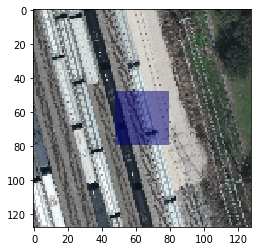

In [23]:
# Visualize a validation pair
idx = random.randint(0, len(X_val)-1)
print(idx)
mask = np.zeros(X_val[idx].shape[:2])
c = centers[0]
label = np.reshape(y_val[idx], (32,32))
mask[c[0]-16:c[0]+16, c[1]-16:c[1]+16] = label + 1
masked = np.ma.masked_where(mask == 0, mask)

plt.imshow(X_val[idx], 'gray', interpolation='none')
plt.imshow(masked, 'jet', interpolation='none', alpha=0.5)
plt.show()

# Create the model

In [52]:
from tensorflow import keras
from tensorflow.keras import layers

model = keras.Sequential(
    [
        keras.Input(shape=(128, 128, 3)),
        layers.Conv2D(128, (32,32), strides=(4,4,), activation="relu"),
        layers.MaxPooling2D((2,2), strides=(1,1,), padding="same", data_format="channels_last"),
        layers.Conv2D(224, (8,8), strides=(1,1), activation="relu"),
        layers.Conv2D(160, (6,6), strides=(1,1), activation="relu"),
        layers.Flatten(),
        layers.Dense(1024, activation="sigmoid")
    ]
)

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 25, 25, 128)       393344    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 25, 25, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 18, 18, 224)       1835232   
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 13, 13, 160)       1290400   
_________________________________________________________________
flatten_1 (Flatten)          (None, 27040)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              27689984  
Total params: 31,208,960
Trainable params: 31,208,960
Non-trainable params: 0
__________________________________________

# Train

In [53]:
model.compile(
    optimizer="sgd",
    loss=keras.losses.BinaryCrossentropy(),
    metrics=["binary_accuracy"],
)

In [54]:
!rm -rf ./logs ./model.*

In [55]:
my_callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=10),
    tf.keras.callbacks.ModelCheckpoint(filepath='model.{epoch:02d}-{val_loss:.2f}.h5'),
    tf.keras.callbacks.TensorBoard(log_dir='./logs'),
]

history = model.fit(
    X_train,
    y_train,
    batch_size=2,
    epochs=40,
    shuffle=True,
    validation_data=(X_val, y_val),
    callbacks=my_callbacks
)

Epoch 1/40
2440/2440 [==============================] - 28s 11ms/step - loss: 0.5993 - binary_accuracy: 0.7247 - val_loss: 0.5784 - val_binary_accuracy: 0.7414
Epoch 2/40
2440/2440 [==============================] - 28s 11ms/step - loss: 0.5920 - binary_accuracy: 0.7338 - val_loss: 0.5701 - val_binary_accuracy: 0.7413
Epoch 3/40
2440/2440 [==============================] - 27s 11ms/step - loss: 0.5849 - binary_accuracy: 0.7341 - val_loss: 0.5737 - val_binary_accuracy: 0.7419
Epoch 4/40
2440/2440 [==============================] - 27s 11ms/step - loss: 0.5817 - binary_accuracy: 0.7339 - val_loss: 0.5723 - val_binary_accuracy: 0.7442
Epoch 5/40
2440/2440 [==============================] - 27s 11ms/step - loss: 0.5772 - binary_accuracy: 0.7349 - val_loss: 0.5483 - val_binary_accuracy: 0.7434
Epoch 6/40
2440/2440 [==============================] - 27s 11ms/step - loss: 0.5727 - binary_accuracy: 0.7368 - val_loss: 0.5479 - val_binary_accuracy: 0.7460
Epoch 7/40
2440/2440 [==================

In [28]:
#%load_ext tensorboard
#%tensorboard --logdir ./logs

# Plot training results

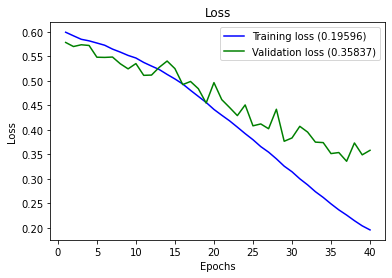

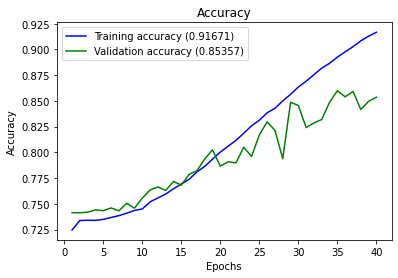

In [56]:
# https://www.kaggle.com/danbrice/keras-plot-history-full-report-and-grid-search
def plot_history(history):
    loss_list = [s for s in history.history.keys() if 'loss' in s and 'val' not in s]
    val_loss_list = [s for s in history.history.keys() if 'loss' in s and 'val' in s]
    acc_list = [s for s in history.history.keys() if 'acc' in s and 'val' not in s]
    val_acc_list = [s for s in history.history.keys() if 'acc' in s and 'val' in s]
    
    if len(loss_list) == 0:
        print('Loss is missing in history')
        return 
    
    ## As loss always exists
    epochs = range(1,len(history.history[loss_list[0]]) + 1)
    
    ## Loss
    plt.figure(1)
    for l in loss_list:
        plt.plot(epochs, history.history[l], 'b', label='Training loss (' + str(str(format(history.history[l][-1],'.5f'))+')'))
    for l in val_loss_list:
        plt.plot(epochs, history.history[l], 'g', label='Validation loss (' + str(str(format(history.history[l][-1],'.5f'))+')'))
    
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    ## Accuracy
    plt.figure(2)
    for l in acc_list:
        plt.plot(epochs, history.history[l], 'b', label='Training accuracy (' + str(format(history.history[l][-1],'.5f'))+')')
    for l in val_acc_list:    
        plt.plot(epochs, history.history[l], 'g', label='Validation accuracy (' + str(format(history.history[l][-1],'.5f'))+')')

    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

plot_history(history)

# Predict

In [57]:
y_pred = model.predict(X_val)
img_pred = np.reshape(y_pred, (y_pred.shape[0], 32, 32))
print(img_pred.shape)

(50, 32, 32)


0


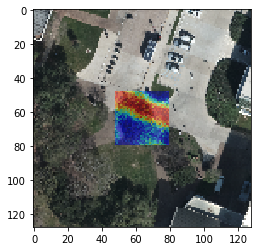

1


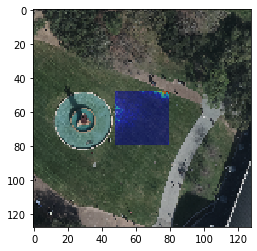

2


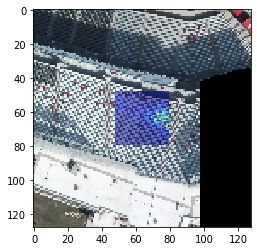

3


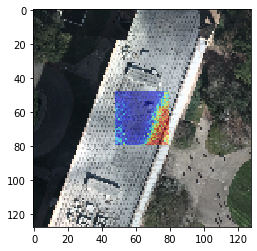

4


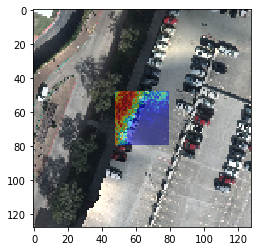

5


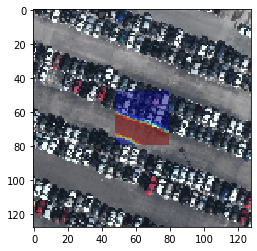

6


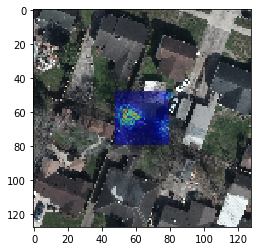

7


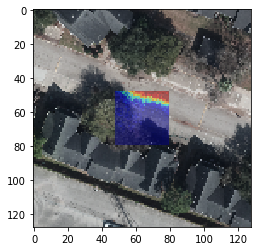

8


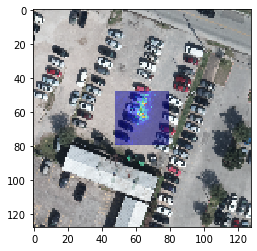

9


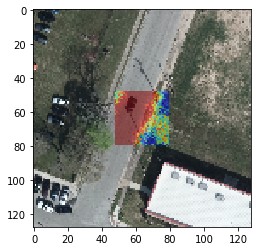

10


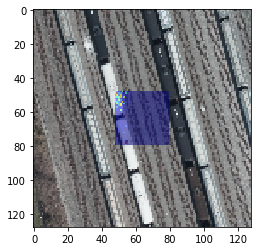

11


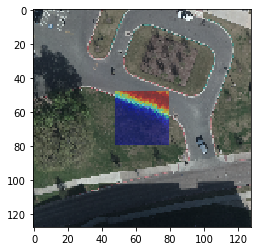

12


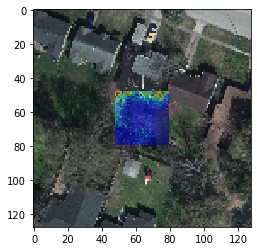

13


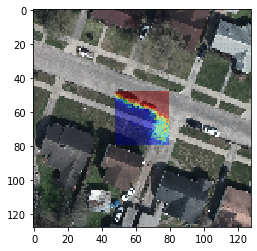

14


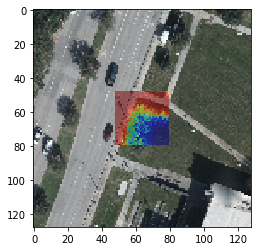

15


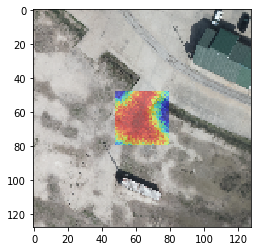

16


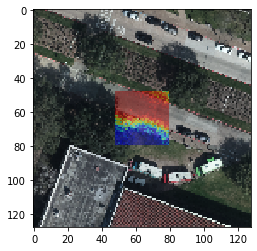

17


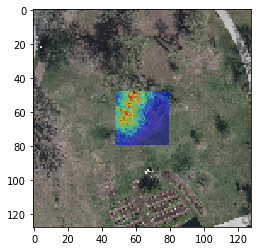

18


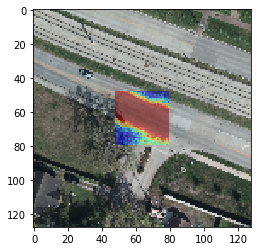

19


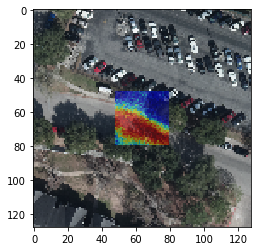

20


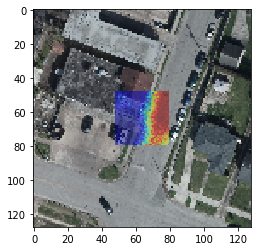

21


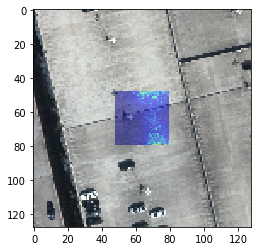

22


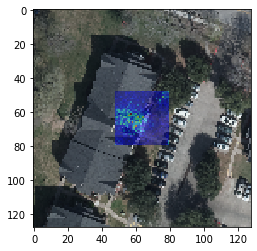

23


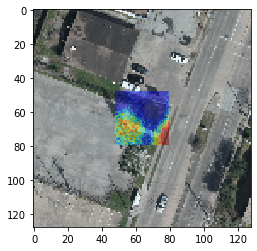

24


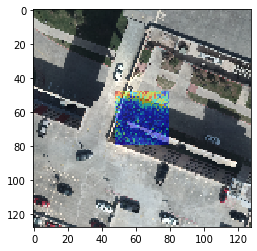

25


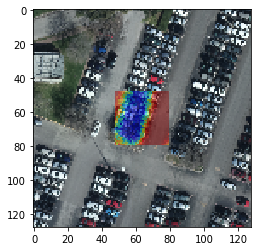

26


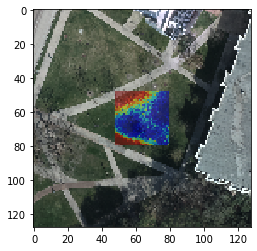

27


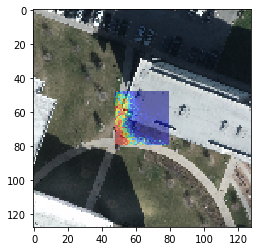

28


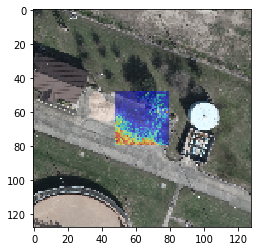

29


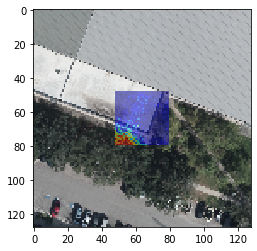

30


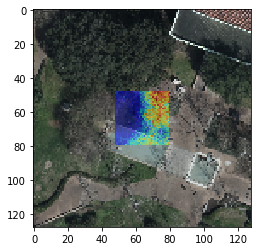

31


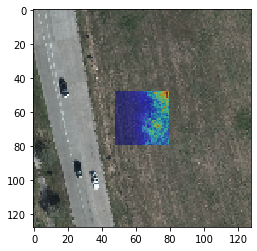

32


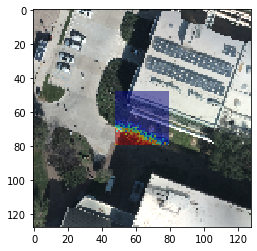

33


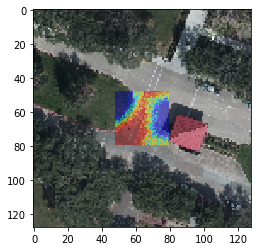

34


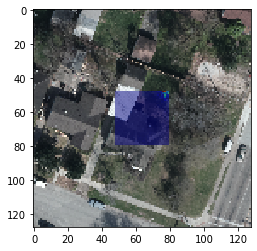

35


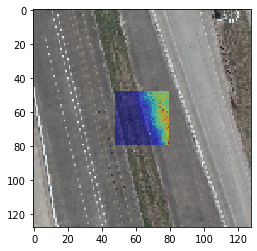

36


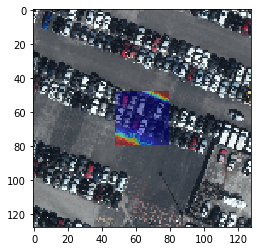

37


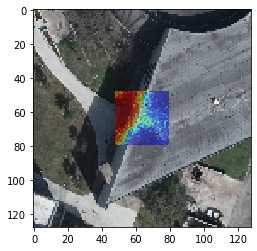

38


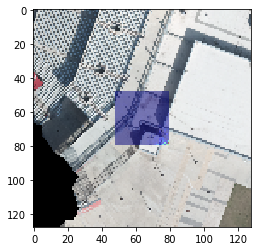

39


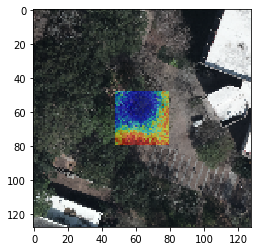

40


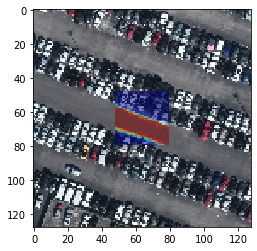

41


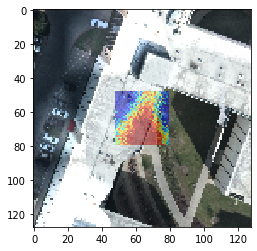

42


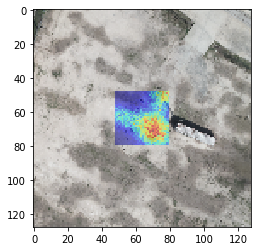

43


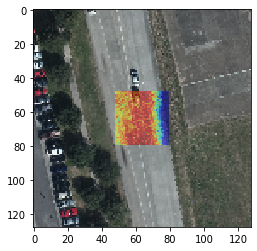

44


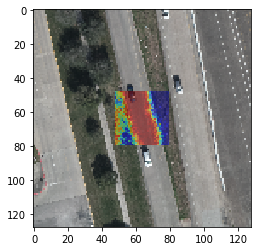

45


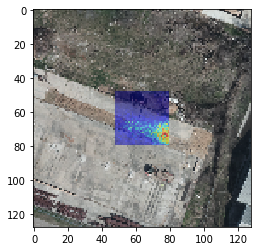

46


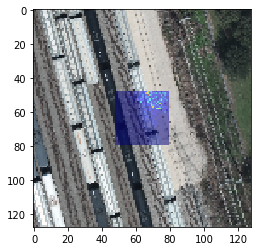

47


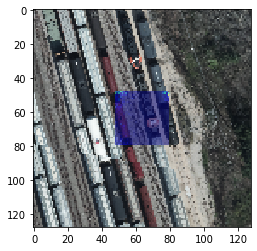

48


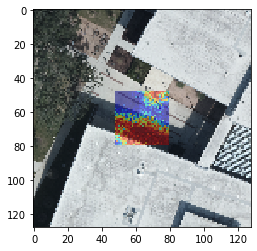

49


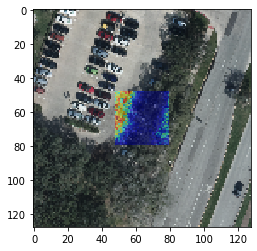

In [58]:
for idxx in range(img_pred.shape[0]):
  print(idxx)
  mask = np.zeros(X_val[idxx].shape[:2])
  c = centers[0]
  mask[c[0]-16:c[0]+16, c[1]-16:c[1]+16] = img_pred[idxx] + 1
  masked = np.ma.masked_where(mask == 0, mask)

  plt.imshow(X_val[idxx], 'gray', interpolation='none')
  plt.imshow(masked, 'jet', interpolation='none', alpha=0.5)
  plt.show()

# Classification Report

In [59]:
y_val.shape

(50, 1024)

In [60]:
y_pred.shape

(50, 1024)

In [61]:
# Thresholding of y_pred
threshold = 0.5
y_pred_t = np.zeros(y_pred.shape)
y_pred_t[y_pred > threshold] = 1
print(y_pred_t.shape)

(50, 1024)


In [62]:
img_pred_t = np.reshape(y_pred_t, (y_pred_t.shape[0], 32, 32))
print(img_pred_t.shape)

(50, 32, 32)


17


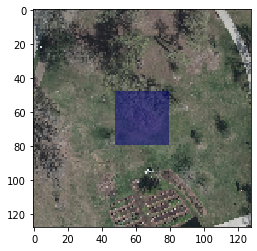

In [63]:
idxx = random.randint(0, len(y_pred_t) - 1)

print(idxx)
mask = np.zeros(X_val[idxx].shape[:2])
c = centers[0]
mask[c[0]-16:c[0]+16, c[1]-16:c[1]+16] = img_pred_t[idxx] + 1
masked = np.ma.masked_where(mask == 0, mask)

plt.imshow(X_val[idxx], 'gray', interpolation='none')
plt.imshow(masked, 'jet', interpolation='none', alpha=0.5)
plt.show()

In [64]:
from sklearn.metrics import classification_report

target_names = ['non-road', 'road']
print(classification_report(np.ravel(y_val), np.ravel(y_pred_t), target_names=target_names))

              precision    recall  f1-score   support

    non-road       0.90      0.90      0.90     37961
        road       0.72      0.72      0.72     13239

    accuracy                           0.85     51200
   macro avg       0.81      0.81      0.81     51200
weighted avg       0.85      0.85      0.85     51200



# Predict a whole image

In [65]:
!megadl --path "/content/data/" "https://mega.co.nz/#!VzInVY4Z!JlYSCYgcVtX7eR9byWo96qhqdwKJtHG4NMTYEhub9dU"


ERROR: Download failed for 'https://mega.co.nz/#!VzInVY4Z!JlYSCYgcVtX7eR9byWo96qhqdwKJtHG4NMTYEhub9dU': Can't open local file /content/data/UH_NAD83_274440_3290290.tif for writing: Error opening file “/content/data/UH_NAD83_274440_3290290.tif”: File exists


In [66]:
topred_img_path = "/content/data/UH_NAD83_274440_3290290.tif"

(12020, 11920, 3)
uint8


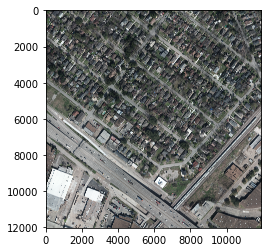

In [67]:
# Show an image
topred_img_bgr = cv2.imread(topred_img_path, cv2.IMREAD_COLOR)
topred_img = cv2.cvtColor(topred_img_bgr,cv2.COLOR_BGR2RGB)  # Convert from bgr to rgb
print(topred_img.shape)  # shape = (12020, 11920, 3)
print(topred_img.dtype)

plt.imshow(topred_img)
plt.show()

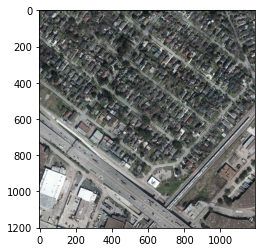

In [68]:
# Resample the resolution from 0.05m to 0.5m
topred_resampled = cv2.resize(topred_img, dsize=new_shape, interpolation=cv2.INTER_NEAREST)

plt.imshow(topred_resampled)
plt.show()

34
1156
[(64, 64), (64, 96), (64, 128), (64, 160), (64, 192), (64, 224), (64, 256), (64, 288), (64, 320), (64, 352), (64, 384), (64, 416), (64, 448), (64, 480), (64, 512), (64, 544), (64, 576), (64, 608), (64, 640), (64, 672), (64, 704), (64, 736), (64, 768), (64, 800), (64, 832), (64, 864), (64, 896), (64, 928), (64, 960), (64, 992), (64, 1024), (64, 1056), (64, 1088), (64, 1120), (96, 64), (96, 96), (96, 128), (96, 160), (96, 192), (96, 224), (96, 256), (96, 288), (96, 320), (96, 352), (96, 384), (96, 416), (96, 448), (96, 480), (96, 512), (96, 544), (96, 576), (96, 608), (96, 640), (96, 672), (96, 704), (96, 736), (96, 768), (96, 800), (96, 832), (96, 864), (96, 896), (96, 928), (96, 960), (96, 992), (96, 1024), (96, 1056), (96, 1088), (96, 1120), (128, 64), (128, 96), (128, 128), (128, 160), (128, 192), (128, 224), (128, 256), (128, 288), (128, 320), (128, 352), (128, 384), (128, 416), (128, 448), (128, 480), (128, 512), (128, 544), (128, 576), (128, 608), (128, 640), (128, 672), (

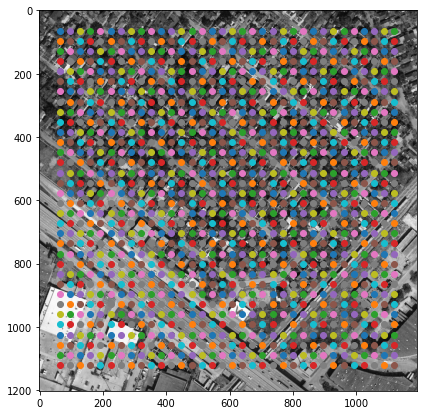

In [69]:
# Find the centers of the patches
topred_centers = []
width_topred = topred_resampled.shape[1]
height_topred = topred_resampled.shape[0]

n_centers_in_row = 0
for col in range(64, width_topred - 64, 32):
  n_centers_in_row += 1
  for row in range(64, height_topred - 64, 32):
    topred_centers.append((col, row))

print(n_centers_in_row)

print(len(topred_centers))
print(topred_centers)

plt.figure(figsize=(24,7))
plt.imshow(topred_resampled[:,:,0], cmap='gray')
for i in range(len(topred_centers)):
  plt.scatter(topred_centers[i][0], topred_centers[i][1])
plt.show()

In [70]:
# Find the INPUT patches centered in 'centers' and with side 128
X_topred = []
for center in topred_centers:
  col_center = center[0]
  row_center = center[1]
  col_min = col_center - 64
  col_max = col_center + 64
  row_min = row_center - 64
  row_max = row_center + 64
  #print(f"{col_min}, {col_max}, {row_min}, {row_max}")
  patch = topred_resampled[row_min:row_max, col_min:col_max, :]
  X_topred.append(patch)
print(len(X_topred))

1156


In [71]:
# Rescale X
X_topred = np.array(X_topred)
X_topred = X_topred / 255.0

In [72]:
y_pred = model.predict(X_topred)
img_pred = np.reshape(y_pred, (y_pred.shape[0], 32, 32))
print(img_pred.shape)

(1156, 32, 32)


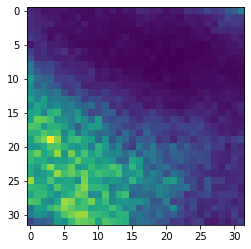

In [73]:
idx = random.randint(0, len(img_pred)-1)
plt.imshow(img_pred[idx])
plt.show()

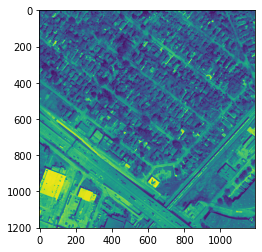

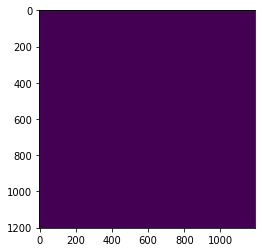

(1202, 1192)


In [74]:
result = np.zeros(topred_resampled.shape[:2])

In [75]:
img_pred[0]

array([[0.05165548, 0.1472638 , 0.09266365, ..., 0.00964933, 0.00332179,
        0.0066534 ],
       [0.09421086, 0.16205373, 0.13473271, ..., 0.00614248, 0.00559457,
        0.00432557],
       [0.08179941, 0.10476946, 0.10261891, ..., 0.00439621, 0.00204882,
        0.0053058 ],
       ...,
       [0.0794213 , 0.11815624, 0.13502167, ..., 0.02027549, 0.01704938,
        0.09448902],
       [0.21949391, 0.12682444, 0.08963989, ..., 0.00687479, 0.03170742,
        0.03330395],
       [0.07626404, 0.09385426, 0.08129579, ..., 0.01298621, 0.03928477,
        0.06632189]], dtype=float32)

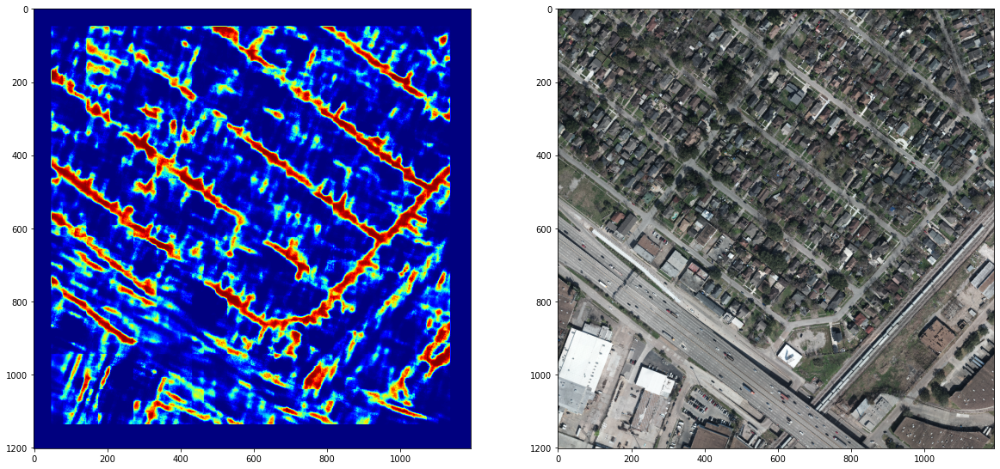

In [76]:
for i, center in enumerate(topred_centers):
  col_center = center[0]
  row_center = center[1]
  col_min = col_center - 16
  col_max = col_center + 16
  row_min = row_center - 16
  row_max = row_center + 16
  result[row_min:row_max, col_min:col_max] = img_pred[i]

_,axs = plt.subplots(1,2, figsize=(20,20))
axs[0].imshow(result, cmap='jet')
axs[1].imshow(topred_resampled)
plt.show()

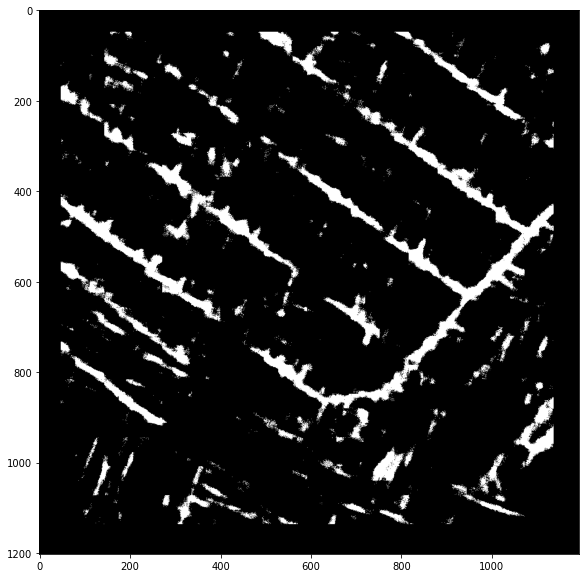

In [79]:
binary_result = np.zeros(result.shape)
binary_result[result > 0.7] = 1.0

plt.figure(figsize=(10,10))
plt.imshow(binary_result, cmap='gray')
plt.show()